
pip install -r requirements.txt
pip install pipwin
pipwin install -r requirements.txt

In [99]:
#from google.colab import drive
#drive.mount('/content/drive')

In [62]:
## Initial Imports

%matplotlib inline

import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
import random
from tqdm import tqdm_notebook as tqdm
from sklearn.model_selection import LeaveOneOut, GridSearchCV, KFold, train_test_split
from sklearn import svm
from sklearn.metrics import accuracy_score, f1_score, classification_report

**`Read data and Display data dimension`**

In [63]:
pd_speech_features = pd.read_csv('pd_speech_features.csv')
new_header = pd_speech_features.iloc[0] #grab the first row for the header
pd_speech_features = pd_speech_features[1:] #take the data less the header row
pd_speech_features.columns = new_header #set the header row as the df header
pd_speech_features.head()
print('The shape of the matrix is :', pd_speech_features.shape)

The shape of the matrix is : (756, 755)


#### Gather most general metadata about the data

In [64]:
pd_speech_features['patient/healthy count'] = 1
pd_speech_features.groupby('class').sum()/3

,patient/healthy count
class,
0,64.0
1,188.0


In [65]:
pd_speech_features = pd_speech_features.drop(['patient/healthy count'], axis = 1)  #756x755

All the data was imported in the object type, we now need to take care about the types in the dataframe

In [66]:
pd_speech_features =  pd_speech_features.astype(float) #per default all floats 
pd_speech_features[['id', 'numPulses', 'numPeriodsPulses']] = pd_speech_features[['id', 'numPulses', 'numPeriodsPulses']].astype(int) #ints
pd_speech_features[['gender', 'class']] = pd_speech_features[['gender', 'class']].astype('category') #categoricals
pd_speech_features.dtypes

0
id                              int32
gender                       category
PPE                           float64
DFA                           float64
RPDE                          float64
                               ...   
tqwt_kurtosisValue_dec_33     float64
tqwt_kurtosisValue_dec_34     float64
tqwt_kurtosisValue_dec_35     float64
tqwt_kurtosisValue_dec_36     float64
class                        category
Length: 755, dtype: object

In [67]:
pd_speech_features_no_tqwt = pd_speech_features[pd_speech_features.columns[1: -433]]
pd_speech_features_no_tqwt.head()

,gender,PPE,DFA,RPDE,numPulses,numPeriodsPulses,meanPeriodPulses,stdDevPeriodPulses,locPctJitter,locAbsJitter,...,app_LT_TKEO_std_1_coef,app_LT_TKEO_std_2_coef,app_LT_TKEO_std_3_coef,app_LT_TKEO_std_4_coef,app_LT_TKEO_std_5_coef,app_LT_TKEO_std_6_coef,app_LT_TKEO_std_7_coef,app_LT_TKEO_std_8_coef,app_LT_TKEO_std_9_coef,app_LT_TKEO_std_10_coef
1,1.0,0.85247,0.71826,0.57227,240,239,0.008064,0.000087,0.00218,0.000018,...,6.2990,16.7003,42.0762,101.0889,228.8489,493.8563,1015.7707,2091.9460,4188.2456,8373.9278
2,1.0,0.76686,0.69481,0.53966,234,233,0.008258,0.000073,0.00195,0.000016,...,6.2381,16.5376,41.7306,100.0918,226.9019,489.9169,1006.3702,2074.4541,4148.9889,8298.1606
3,1.0,0.85083,0.67604,0.58982,232,231,0.008340,0.000060,0.00176,0.000015,...,6.2163,16.4817,41.4869,99.6154,225.7803,486.9865,1001.7348,2064.1067,4127.0967,8254.7868
4,0.0,0.41121,0.79672,0.59257,178,177,0.010858,0.000183,0.00419,0.000046,...,6.7833,16.8216,41.3157,94.4579,211.1565,443.3447,955.8128,1890.1299,3910.7029,7698.9389
5,0.0,0.32790,0.79782,0.53028,236,235,0.008162,0.002669,0.00535,0.000044,...,6.9366,18.3595,46.2704,108.6792,244.0607,541.2414,1057.2566,2242.5460,4297.4639,8645.2845


## Remove outliers
for one specifc column based on the interquartile interval 

for all the columns based on the z-score 

In [68]:
#idx = np.arange(0, len(pd_speech_features) / 3).astype(int)
#random_idx = random.sample(range(0, 251), int(len(pd_speech_features) * 0.85 / 3))

train_df = pd_speech_features#[pd_speech_features.id.isin(random_idx)]
#validation_df = pd_speech_features[np.logical_not(pd_speech_features.id.isin(random_idx))]

#newly added
#train_df_tqwt = pd_speech_features[pd_speech_features.id.isin(random_idx)]
#validation_df_tqwt = pd_speech_features[np.logical_not(pd_speech_features.id.isin(random_idx))]
##

#train_df_purged = pd_speech_features_no_tqwt[pd_speech_features_no_tqwt.id.isin(random_idx)]
#validation_df_purged = pd_speech_features_no_tqwt[np.logical_not(pd_speech_features_no_tqwt.id.isin(random_idx))]

y_train = train_df['class']
y_train = np.array(y_train.values, dtype = 'int')
x_train = train_df.drop(['class','id'], axis = 1) 
x_train=x_train.values
#y_validation = validation_df['class']
#y_validation = np.array(y_validation.values, dtype = 'int')
#x_validation = validation_df.drop(['class'], axis = 1) 

In [69]:
features=train_df.columns.values.tolist()
features.remove('class')
features.remove('id')
print(len(features))
print(x_train.shape)

753
(756, 753)


In [70]:
x_train_df_tqwt=pd_speech_features_no_tqwt.values

#y_train_tqwt = train_df_tqwt['class']
#y_train_tqwt = np.array(y_train_tqwt.values, dtype = 'int')
#x_train_tqwt = train_df_tqwt.drop(['class'], axis = 1) 

#y_validation_tqwt = validation_df_tqwt['class']
#y_validation_tqwt = np.array(y_validation_tqwt.values, dtype = 'int')
#x_validation_tqwt = validation_df_tqwt.drop(['class'], axis = 1) 

In [71]:
#shorter version
'''
y_train = train_df['class']
y_train = np.array(y_train.values, dtype = 'int')

x_train = train_df_purged[1:50] 
y_train = y_train[1:50]

y_validation = validation_df['class']
y_validation = np.array(y_validation.values, dtype = 'int')
x_validation = validation_df_purged

x_validation = train_df_purged[1:20]
y_validation = y_train[1:20]
'''


"\ny_train = train_df['class']\ny_train = np.array(y_train.values, dtype = 'int')\n\nx_train = train_df_purged[1:50] \ny_train = y_train[1:50]\n\ny_validation = validation_df['class']\ny_validation = np.array(y_validation.values, dtype = 'int')\nx_validation = validation_df_purged\n\nx_validation = train_df_purged[1:20]\ny_validation = y_train[1:20]\n"

In [72]:
print(x_train_df_tqwt.shape)
#print(y_train_tqwt.shape)

(756, 321)


In [190]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
x_train= sc.fit_transform(x_train)
#newly added
x_train_df_tqwt= sc.fit_transform(x_train_df_tqwt)

In [191]:
trainx, testx, trainy, testy=train_test_split(x_train, y_train, test_size=0.25, random_state=10 )

trainx_no_tqwt, testx_no_tqwt, trainy_no_tqwt, testy_no_tqwt=train_test_split(x_train_df_tqwt, y_train, test_size=0.25, random_state=10 )

In [192]:
print(trainx.shape)
print(trainx_no_tqwt.shape)

(567, 753)
(567, 321)


In [193]:
kfold=KFold(10, shuffle=True, random_state=10)

In [194]:
def svm_model(X,y, kfold):
    params={'C':[0.1, 1, 10, 100, 1000], 'gamma':[1, 0.1, 0.01, 0.001, 0.0001], 'kernel':['rbf']}

    grid=GridSearchCV(svm.SVC(probability=True),params,cv=kfold, refit=True, verbose=3)
    grid.fit(X,y)
    
    return grid

# with tqwt features


In [78]:
grid=svm_model(trainx, trainy, kfold)

Fitting 10 folds for each of 25 candidates, totalling 250 fits
[CV] C=0.1, gamma=1, kernel=rbf ......................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.772, total=   1.4s
[CV] C=0.1, gamma=1, kernel=rbf ......................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.3s remaining:    0.0s


[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.772, total=   1.4s
[CV] C=0.1, gamma=1, kernel=rbf ......................................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    2.8s remaining:    0.0s


[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.649, total=   1.4s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.789, total=   1.4s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.702, total=   1.5s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.719, total=   1.7s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.719, total=   1.7s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.750, total=   1.5s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.786, total=   1.5s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .

[CV] .......... C=1, gamma=0.1, kernel=rbf, score=0.772, total=   1.5s
[CV] C=1, gamma=0.1, kernel=rbf ......................................
[CV] .......... C=1, gamma=0.1, kernel=rbf, score=0.772, total=   1.4s
[CV] C=1, gamma=0.1, kernel=rbf ......................................
[CV] .......... C=1, gamma=0.1, kernel=rbf, score=0.649, total=   1.4s
[CV] C=1, gamma=0.1, kernel=rbf ......................................
[CV] .......... C=1, gamma=0.1, kernel=rbf, score=0.789, total=   1.4s
[CV] C=1, gamma=0.1, kernel=rbf ......................................
[CV] .......... C=1, gamma=0.1, kernel=rbf, score=0.702, total=   1.4s
[CV] C=1, gamma=0.1, kernel=rbf ......................................
[CV] .......... C=1, gamma=0.1, kernel=rbf, score=0.719, total=   1.4s
[CV] C=1, gamma=0.1, kernel=rbf ......................................
[CV] .......... C=1, gamma=0.1, kernel=rbf, score=0.719, total=   1.5s
[CV] C=1, gamma=0.1, kernel=rbf ......................................
[CV] .

[CV] ......... C=10, gamma=0.1, kernel=rbf, score=0.786, total=   1.4s
[CV] C=10, gamma=0.1, kernel=rbf .....................................
[CV] ......... C=10, gamma=0.1, kernel=rbf, score=0.732, total=   1.4s
[CV] C=10, gamma=0.01, kernel=rbf ....................................
[CV] ........ C=10, gamma=0.01, kernel=rbf, score=0.772, total=   1.4s
[CV] C=10, gamma=0.01, kernel=rbf ....................................
[CV] ........ C=10, gamma=0.01, kernel=rbf, score=0.772, total=   1.4s
[CV] C=10, gamma=0.01, kernel=rbf ....................................
[CV] ........ C=10, gamma=0.01, kernel=rbf, score=0.684, total=   1.5s
[CV] C=10, gamma=0.01, kernel=rbf ....................................
[CV] ........ C=10, gamma=0.01, kernel=rbf, score=0.789, total=   1.6s
[CV] C=10, gamma=0.01, kernel=rbf ....................................
[CV] ........ C=10, gamma=0.01, kernel=rbf, score=0.702, total=   1.6s
[CV] C=10, gamma=0.01, kernel=rbf ....................................
[CV] .

[CV] ....... C=100, gamma=0.01, kernel=rbf, score=0.719, total=   1.4s
[CV] C=100, gamma=0.01, kernel=rbf ...................................
[CV] ....... C=100, gamma=0.01, kernel=rbf, score=0.750, total=   1.4s
[CV] C=100, gamma=0.01, kernel=rbf ...................................
[CV] ....... C=100, gamma=0.01, kernel=rbf, score=0.786, total=   1.5s
[CV] C=100, gamma=0.01, kernel=rbf ...................................
[CV] ....... C=100, gamma=0.01, kernel=rbf, score=0.750, total=   1.4s
[CV] C=100, gamma=0.001, kernel=rbf ..................................
[CV] ...... C=100, gamma=0.001, kernel=rbf, score=0.895, total=   1.2s
[CV] C=100, gamma=0.001, kernel=rbf ..................................
[CV] ...... C=100, gamma=0.001, kernel=rbf, score=0.842, total=   1.2s
[CV] C=100, gamma=0.001, kernel=rbf ..................................
[CV] ...... C=100, gamma=0.001, kernel=rbf, score=0.860, total=   1.2s
[CV] C=100, gamma=0.001, kernel=rbf ..................................
[CV] .

[CV] ..... C=1000, gamma=0.001, kernel=rbf, score=0.807, total=   1.2s
[CV] C=1000, gamma=0.001, kernel=rbf .................................
[CV] ..... C=1000, gamma=0.001, kernel=rbf, score=0.912, total=   1.2s
[CV] C=1000, gamma=0.001, kernel=rbf .................................
[CV] ..... C=1000, gamma=0.001, kernel=rbf, score=0.895, total=   1.2s
[CV] C=1000, gamma=0.001, kernel=rbf .................................
[CV] ..... C=1000, gamma=0.001, kernel=rbf, score=0.946, total=   1.2s
[CV] C=1000, gamma=0.001, kernel=rbf .................................
[CV] ..... C=1000, gamma=0.001, kernel=rbf, score=0.911, total=   1.2s
[CV] C=1000, gamma=0.001, kernel=rbf .................................
[CV] ..... C=1000, gamma=0.001, kernel=rbf, score=0.875, total=   1.2s
[CV] C=1000, gamma=0.0001, kernel=rbf ................................
[CV] .... C=1000, gamma=0.0001, kernel=rbf, score=0.860, total=   0.7s
[CV] C=1000, gamma=0.0001, kernel=rbf ................................
[CV] .

[Parallel(n_jobs=1)]: Done 250 out of 250 | elapsed:  5.2min finished
c:\users\asus\anaconda3\envs\deeplearn2\lib\site-packages\sklearn\model_selection\_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


In [79]:
print(grid.best_score_)
print(grid.best_params_)
print('cv scores:')
print(grid.cv_results_)
estimator=grid.best_estimator_

0.8818342151675485
{'C': 10, 'gamma': 0.001, 'kernel': 'rbf'}
cv scores:
{'mean_fit_time': array([1.47997108, 1.46686194, 1.46255271, 0.87543175, 0.81818237,
       1.46772094, 1.43337288, 1.4409333 , 0.8712359 , 0.79530671,
       1.4878948 , 1.38969722, 1.54534678, 1.38545449, 0.69928236,
       1.42682433, 1.37155881, 1.36383762, 1.14935908, 0.6687999 ,
       1.41185663, 1.43484685, 1.39068522, 1.16251495, 0.67480755]), 'std_fit_time': array([0.08864525, 0.04613445, 0.04567215, 0.03284821, 0.03720072,
       0.03869087, 0.07539084, 0.05150575, 0.0388274 , 0.04065698,
       0.0521912 , 0.01802769, 0.28352379, 0.27470885, 0.02598775,
       0.02971251, 0.01970264, 0.02290284, 0.02145482, 0.01734618,
       0.02246214, 0.07167568, 0.02131658, 0.02137799, 0.02819579]), 'mean_score_time': array([0.03207331, 0.03269083, 0.03193629, 0.0178529 , 0.01694846,
       0.031778  , 0.0309818 , 0.03247995, 0.01785481, 0.01624393,
       0.03133261, 0.03058181, 0.03277283, 0.02075002, 0.01373103,

In [80]:
estimator=grid.best_estimator_
print(classification_report(testy, estimator.predict(testx)))

              precision    recall  f1-score   support

           0       0.84      0.61      0.71        44
           1       0.89      0.97      0.93       145

    accuracy                           0.88       189
   macro avg       0.87      0.79      0.82       189
weighted avg       0.88      0.88      0.88       189



In [81]:
preds_with_tqwt=estimator.predict(testx)
wrong_indices_with_tqwt=[i for i in range(testx.shape[0]) if testy[i]!=preds_with_tqwt[i]]
print(wrong_indices_with_tqwt)

[14, 31, 34, 38, 46, 50, 60, 70, 91, 92, 100, 101, 105, 111, 113, 119, 120, 131, 154, 175, 187, 188]


# lime explanation

In [82]:
!pip install shape

#lime

In [83]:
import lime
import lime.lime_tabular
import eli5
import shape

In [84]:
lime_explainer=lime.lime_tabular.LimeTabularExplainer(trainx,feature_names=features, class_names=[0,1], mode='classification')

In [123]:
lime_explainer = lime.lime_tabular.LimeTabularExplainer(testx, feature_names=features,
                                                  class_names=[0,1], verbose=True, mode='classification')

In [124]:
#wrong prediction
print('instance 14 (wrong prediction):')
e14=lime_explainer.explain_instance(testx[14],estimator.predict_proba, num_features=20)
print('instance 31 (wrong prediction):')
e31=lime_explainer.explain_instance(testx[31],estimator.predict_proba, num_features=20)

#correct prediction
print('instance 10 (correct prediction):')
e10=lime_explainer.explain_instance(testx[10],estimator.predict_proba, num_features=20)
print('instance 5 (correct prediction):')
e5=lime_explainer.explain_instance(testx[5],estimator.predict_proba, num_features=20)

instance 14 (wrong prediction):
Intercept 0.8190403934083614
Prediction_local [0.51798625]
Right: 0.7493187418056606
instance 31 (wrong prediction):
Intercept 0.8075778787633674
Prediction_local [0.56509228]
Right: 0.14648822858086513
instance 10 (correct prediction):
Intercept 0.6915302514822945
Prediction_local [0.92212247]
Right: 0.9939766186120588
instance 5 (correct prediction):
Intercept 0.7484024061923208
Prediction_local [0.74940208]
Right: 0.9759368843521824


In [125]:
e14.show_in_notebook(show_table=True)

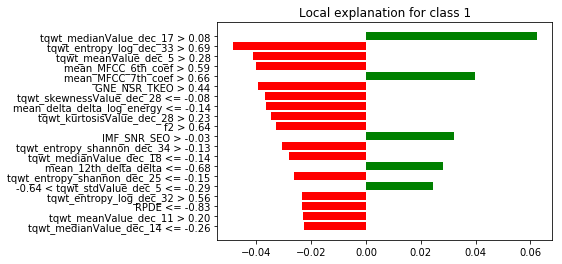

In [126]:
explanation=e14.as_pyplot_figure()
explanation.savefig('e14_explanation.png')

In [127]:
e31.show_in_notebook(show_table=True)

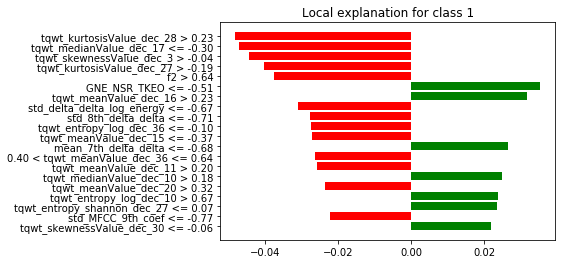

In [128]:
explanation31=e31.as_pyplot_figure()
explanation31.savefig('e31_explanation.png')

In [129]:
e5.show_in_notebook(show_table=True)

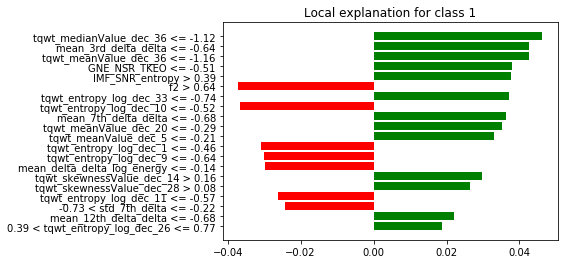

In [130]:
explainer10=e10.as_pyplot_figure()
explainer10.savefig('e10_lime_explanation.png')

In [131]:
e5.show_in_notebook(show_table=True)

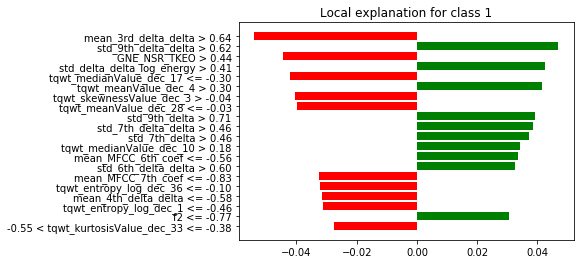

In [132]:
expliner5=e5.as_pyplot_figure()
expliner5.savefig('e5_lime_explanation.png')

# without tqwt

In [195]:
grid_no_tqwt=svm_model(trainx_no_tqwt, trainy_no_tqwt, kfold)

Fitting 10 folds for each of 25 candidates, totalling 250 fits
[CV] C=0.1, gamma=1, kernel=rbf ......................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.772, total=   0.6s
[CV] C=0.1, gamma=1, kernel=rbf ......................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.772, total=   0.6s
[CV] C=0.1, gamma=1, kernel=rbf ......................................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.2s remaining:    0.0s


[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.649, total=   0.6s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.789, total=   0.6s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.702, total=   0.6s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.719, total=   0.6s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.719, total=   0.6s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.750, total=   0.6s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.786, total=   0.6s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .

[CV] .......... C=1, gamma=0.1, kernel=rbf, score=0.772, total=   0.6s
[CV] C=1, gamma=0.1, kernel=rbf ......................................
[CV] .......... C=1, gamma=0.1, kernel=rbf, score=0.772, total=   0.6s
[CV] C=1, gamma=0.1, kernel=rbf ......................................
[CV] .......... C=1, gamma=0.1, kernel=rbf, score=0.649, total=   0.6s
[CV] C=1, gamma=0.1, kernel=rbf ......................................
[CV] .......... C=1, gamma=0.1, kernel=rbf, score=0.789, total=   0.6s
[CV] C=1, gamma=0.1, kernel=rbf ......................................
[CV] .......... C=1, gamma=0.1, kernel=rbf, score=0.702, total=   0.6s
[CV] C=1, gamma=0.1, kernel=rbf ......................................
[CV] .......... C=1, gamma=0.1, kernel=rbf, score=0.719, total=   0.6s
[CV] C=1, gamma=0.1, kernel=rbf ......................................
[CV] .......... C=1, gamma=0.1, kernel=rbf, score=0.719, total=   0.6s
[CV] C=1, gamma=0.1, kernel=rbf ......................................
[CV] .

[CV] ......... C=10, gamma=0.1, kernel=rbf, score=0.786, total=   0.6s
[CV] C=10, gamma=0.1, kernel=rbf .....................................
[CV] ......... C=10, gamma=0.1, kernel=rbf, score=0.732, total=   0.6s
[CV] C=10, gamma=0.01, kernel=rbf ....................................
[CV] ........ C=10, gamma=0.01, kernel=rbf, score=0.877, total=   0.6s
[CV] C=10, gamma=0.01, kernel=rbf ....................................
[CV] ........ C=10, gamma=0.01, kernel=rbf, score=0.789, total=   0.6s
[CV] C=10, gamma=0.01, kernel=rbf ....................................
[CV] ........ C=10, gamma=0.01, kernel=rbf, score=0.860, total=   0.6s
[CV] C=10, gamma=0.01, kernel=rbf ....................................
[CV] ........ C=10, gamma=0.01, kernel=rbf, score=0.877, total=   0.6s
[CV] C=10, gamma=0.01, kernel=rbf ....................................
[CV] ........ C=10, gamma=0.01, kernel=rbf, score=0.825, total=   0.6s
[CV] C=10, gamma=0.01, kernel=rbf ....................................
[CV] .

[CV] ....... C=100, gamma=0.01, kernel=rbf, score=0.947, total=   0.6s
[CV] C=100, gamma=0.01, kernel=rbf ...................................
[CV] ....... C=100, gamma=0.01, kernel=rbf, score=0.821, total=   0.6s
[CV] C=100, gamma=0.01, kernel=rbf ...................................
[CV] ....... C=100, gamma=0.01, kernel=rbf, score=0.875, total=   0.6s
[CV] C=100, gamma=0.01, kernel=rbf ...................................
[CV] ....... C=100, gamma=0.01, kernel=rbf, score=0.804, total=   0.6s
[CV] C=100, gamma=0.001, kernel=rbf ..................................
[CV] ...... C=100, gamma=0.001, kernel=rbf, score=0.860, total=   0.3s
[CV] C=100, gamma=0.001, kernel=rbf ..................................
[CV] ...... C=100, gamma=0.001, kernel=rbf, score=0.825, total=   0.3s
[CV] C=100, gamma=0.001, kernel=rbf ..................................
[CV] ...... C=100, gamma=0.001, kernel=rbf, score=0.737, total=   0.3s
[CV] C=100, gamma=0.001, kernel=rbf ..................................
[CV] .

[CV] ..... C=1000, gamma=0.001, kernel=rbf, score=0.754, total=   0.3s
[CV] C=1000, gamma=0.001, kernel=rbf .................................
[CV] ..... C=1000, gamma=0.001, kernel=rbf, score=0.825, total=   0.3s
[CV] C=1000, gamma=0.001, kernel=rbf .................................
[CV] ..... C=1000, gamma=0.001, kernel=rbf, score=0.947, total=   0.3s
[CV] C=1000, gamma=0.001, kernel=rbf .................................
[CV] ..... C=1000, gamma=0.001, kernel=rbf, score=0.839, total=   0.3s
[CV] C=1000, gamma=0.001, kernel=rbf .................................
[CV] ..... C=1000, gamma=0.001, kernel=rbf, score=0.821, total=   0.3s
[CV] C=1000, gamma=0.001, kernel=rbf .................................
[CV] ..... C=1000, gamma=0.001, kernel=rbf, score=0.750, total=   0.3s
[CV] C=1000, gamma=0.0001, kernel=rbf ................................
[CV] .... C=1000, gamma=0.0001, kernel=rbf, score=0.877, total=   0.3s
[CV] C=1000, gamma=0.0001, kernel=rbf ................................
[CV] .

[Parallel(n_jobs=1)]: Done 250 out of 250 | elapsed:  2.0min finished
c:\users\asus\anaconda3\envs\deeplearn2\lib\site-packages\sklearn\model_selection\_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


In [196]:
estimator_no_tqwt=grid_no_tqwt.best_estimator_
print(classification_report(testy, estimator_no_tqwt.predict(testx_no_tqwt)))

              precision    recall  f1-score   support

           0       0.78      0.41      0.54        44
           1       0.84      0.97      0.90       145

    accuracy                           0.84       189
   macro avg       0.81      0.69      0.72       189
weighted avg       0.83      0.84      0.82       189



In [197]:
preds_without_tqwt=estimator_no_tqwt.predict(testx_no_tqwt)
wrong_indices_without_tqwt=[i for i in range(testx_no_tqwt.shape[0]) if testy[i]!=preds_without_tqwt[i]]
print(wrong_indices_without_tqwt)

[14, 18, 31, 34, 38, 46, 58, 60, 70, 84, 91, 92, 98, 99, 100, 101, 111, 113, 118, 119, 124, 135, 139, 147, 149, 154, 155, 156, 167, 171, 187]


In [198]:
lime_explainer_no_tqwt = lime.lime_tabular.LimeTabularExplainer(testx_no_tqwt, feature_names=features[:321],
                                                  class_names=[0,1], verbose=True, mode='classification')
lime_explainer_no_tqwt.random_state.seed(10)

In [199]:
print(len(features[:321]))
print(testx_no_tqwt.shape[1])

321
321


In [200]:
wrong_indices_with_tqwt==wrong_indices_without_tqwt

False

In [203]:
print("No TQWT")
print('instance 14 (wrong prediction):')
en14=lime_explainer_no_tqwt.explain_instance(testx_no_tqwt[14],estimator_no_tqwt.predict_proba, num_features=20)
print('instance 31 (wrong prediction):')
en31=lime_explainer_no_tqwt.explain_instance(testx_no_tqwt[31],estimator_no_tqwt.predict_proba, num_features=20)

#correct prediction
print('instance 10 (correct prediction):')
en10=lime_explainer_no_tqwt.explain_instance(testx_no_tqwt[10],estimator_no_tqwt.predict_proba, num_features=20)
print('instance 5 (correct prediction):')
en5=lime_explainer_no_tqwt.explain_instance(testx_no_tqwt[5],estimator_no_tqwt.predict_proba, num_features=20)

No TQWT
instance 14 (wrong prediction):
Intercept 0.8462415989166158
Prediction_local [0.78762358]
Right: 0.8626613768230232
instance 31 (wrong prediction):
Intercept 0.8549558149317178
Prediction_local [0.76426852]
Right: 0.10251143928771714
instance 10 (correct prediction):
Intercept 0.8267026386790016
Prediction_local [0.84219221]
Right: 0.9908029906514281
instance 5 (correct prediction):
Intercept 0.8318092803345665
Prediction_local [0.83173332]
Right: 0.9268959179382016


In [204]:
en14.show_in_notebook(show_table=True)

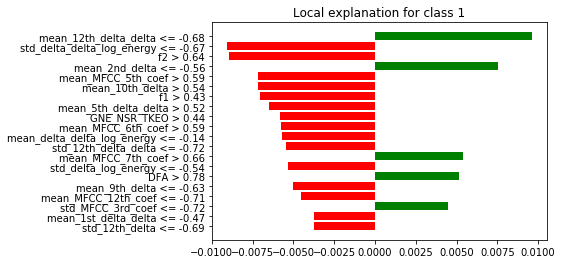

In [205]:
explainer14_tqwt=en14.as_pyplot_figure()
explainer14_tqwt.savefig('explainer 14 no tqwt.png')

In [206]:
en31.show_in_notebook(show_table=True)

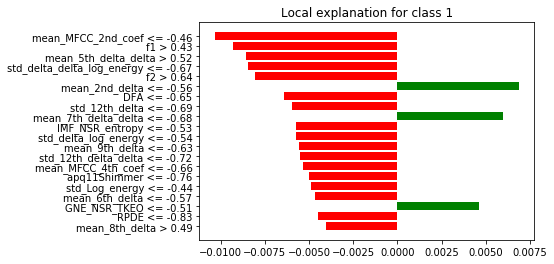

In [207]:
explainer31_tqwt=en31.as_pyplot_figure()
explainer31_tqwt.savefig('explainer 31 no tqwt.png')

In [208]:
en10.show_in_notebook(show_table=True)

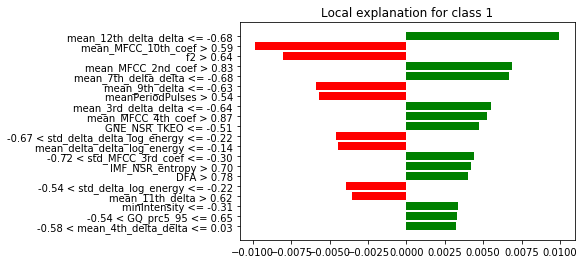

In [209]:
explainer10_tqwt=en10.as_pyplot_figure()
explainer10_tqwt.savefig('explainer 10 no tqwt.png')

In [210]:
en5.show_in_notebook(show_table=True)

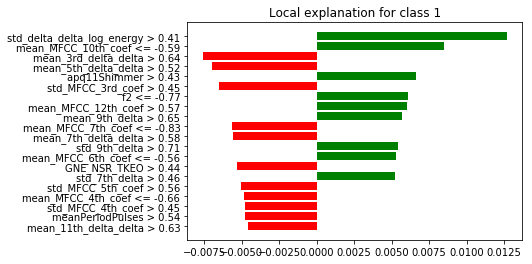

In [211]:
explainer5n=en5.as_pyplot_figure()
explainer5n.savefig('explainer 5 no tqwt.png')